In [1]:
import os

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, LeakyReLU, BatchNormalization, Dropout
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt

In [2]:
IMAGE_SHAPE = (128, 128, 3)
IMAGE_PATH = "pokemon/"
BATCH_SIZE = 64
EPOCHS = 100

In [3]:
def load_images(directory, img_size, val_split=0.3):
    train_ds = tf.keras.utils.image_dataset_from_directory(
        directory,
        validation_split=val_split,
        subset="training",
        seed=42,
        image_size=img_size,
        batch_size=None,
        label_mode=None,
        labels=None
    )

    val_ds = tf.keras.utils.image_dataset_from_directory(
        directory,
        validation_split=val_split,
        subset="validation",
        seed=42,
        image_size=img_size,
        batch_size=None,
        label_mode=None,
        labels=None
    )
    
    split_size = int(val_ds.cardinality().numpy() * 0.5)
    
    test_ds = val_ds.skip(split_size)
    val_ds = val_ds.take(split_size)

    return train_ds, val_ds, test_ds

In [4]:
train_ds, val_ds, test_ds = load_images(IMAGE_PATH, IMAGE_SHAPE[:-1])

Found 17261 files belonging to 1 classes.
Using 12083 files for training.
Found 17261 files belonging to 1 classes.
Using 5178 files for validation.


In [5]:
def add_noise(image, mean=0, stddev=1, amplitude=0.3):
    image = tf.cast(image, dtype=tf.float32) / 255.    
    noise = tf.random.normal(tf.shape(image), mean=mean, stddev=stddev, dtype=tf.float32)
    noisy_image = tf.clip_by_value(image + amplitude * noise, 0, 1)
    
    return noisy_image, image

In [6]:
train_ds = train_ds.map(add_noise, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.map(add_noise, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.map(add_noise, num_parallel_calls=tf.data.AUTOTUNE)

In [7]:
train_ds = train_ds.batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [8]:
def conv_block(inputs, num_filters, dropout_rate=0.0):
    x = Conv2D(num_filters, (3, 3), padding="same")(inputs)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.1)(x)
    x = Conv2D(num_filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(alpha=0.1)(x)
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
        
    return x

In [9]:
def unet(input_shape, num_filters=64):
    inputs = Input(input_shape)

    # Encoder
    conv1 = conv_block(inputs, num_filters)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = conv_block(pool1, num_filters * 2)
    pool2 = MaxPooling2D((2, 2))(conv2)

    conv3 = conv_block(pool2, num_filters * 4)
    pool3 = MaxPooling2D((2, 2))(conv3)

    conv4 = conv_block(pool3, num_filters * 8, dropout_rate=0.4)
    pool4 = MaxPooling2D((2, 2))(conv4)

    # Bottleneck
    conv5 = conv_block(pool4, num_filters * 16, dropout_rate=0.5)

    # Decoder
    up6 = concatenate([Conv2DTranspose(num_filters * 8, (2, 2), strides=(2, 2), padding="same")(conv5), conv4])
    conv6 = conv_block(up6, num_filters * 8, dropout_rate=0.4)

    up7 = concatenate([Conv2DTranspose(num_filters * 4, (2, 2), strides=(2, 2), padding="same")(conv6), conv3])
    conv7 = conv_block(up7, num_filters * 4)

    up8 = concatenate([Conv2DTranspose(num_filters * 2, (2, 2), strides=(2, 2), padding="same")(conv7), conv2])
    conv8 = conv_block(up8, num_filters * 2)

    up9 = concatenate([Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding="same")(conv8), conv1])
    conv9 = conv_block(up9, num_filters)

    # Output layer
    outputs = Conv2D(3, (1, 1), activation="sigmoid")(conv9)

    return Model(inputs=inputs, outputs=outputs)

In [10]:
model = unet(IMAGE_SHAPE, num_filters=32)
model.compile(optimizer="adam", loss="mean_squared_error")

In [11]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [12]:
class DisplayImages(tf.keras.callbacks.Callback):
    def __init__(self, val_dataset, model):
        super().__init__()
        self.val_dataset = val_dataset.unbatch()
        self.model = model
        
    def on_epoch_end(self, epoch, logs=None):
        noisy_val_images, val_images = next(iter(self.val_dataset.shuffle(128)))
        reconstructed_images = self.model.predict(tf.expand_dims(noisy_val_images, axis=0), verbose=0)
        
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
        axes[0].imshow(noisy_val_images)
        axes[0].set_title("Input")
        axes[0].axis("off")

        axes[1].imshow(val_images)
        axes[1].set_title("Ground Truth")
        axes[1].axis("off")

        axes[2].imshow(reconstructed_images[0])
        axes[2].set_title("Reconstructed")
        axes[2].axis("off")
            
        plt.show()

In [13]:
di_callback = DisplayImages(val_ds, model)

Epoch 1/100
189/189 [==============================] - ETA: 0s - loss: 0.0134

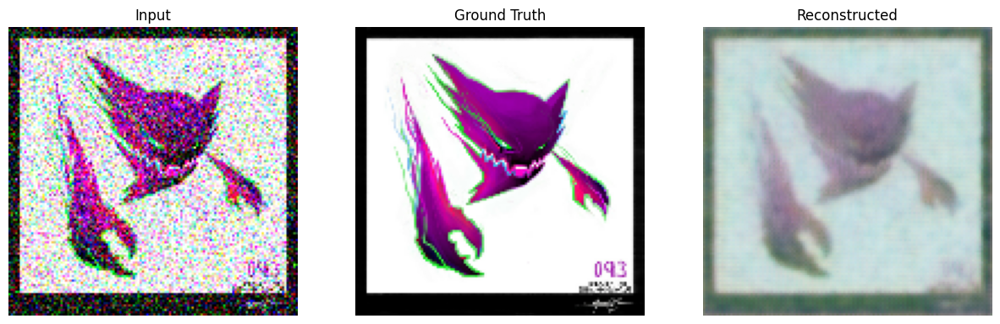

189/189 [==============================] - 37s 129ms/step - loss: 0.0134 - val_loss: 0.0479
Epoch 2/100
189/189 [==============================] - ETA: 0s - loss: 0.0071

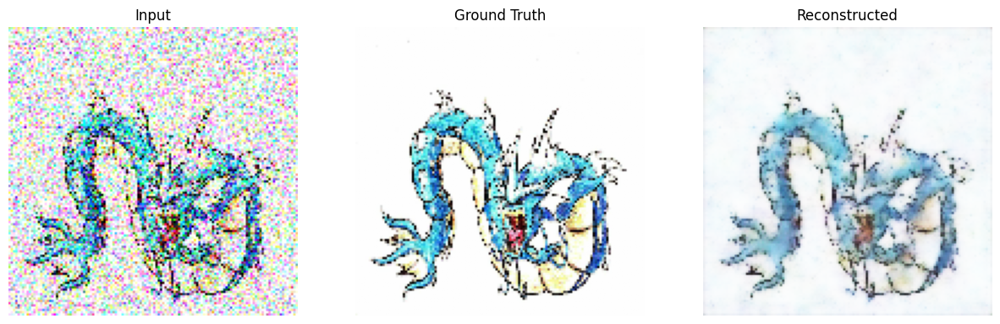

189/189 [==============================] - 13s 70ms/step - loss: 0.0071 - val_loss: 0.0108
Epoch 3/100
189/189 [==============================] - ETA: 0s - loss: 0.0065

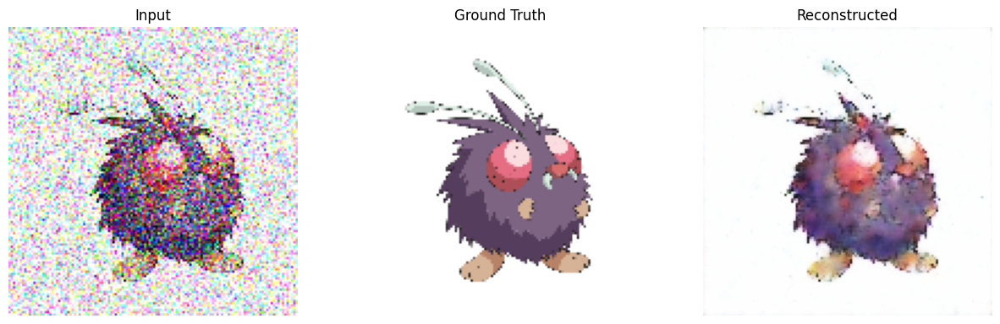

189/189 [==============================] - 13s 70ms/step - loss: 0.0065 - val_loss: 0.0070
Epoch 4/100
189/189 [==============================] - ETA: 0s - loss: 0.0061

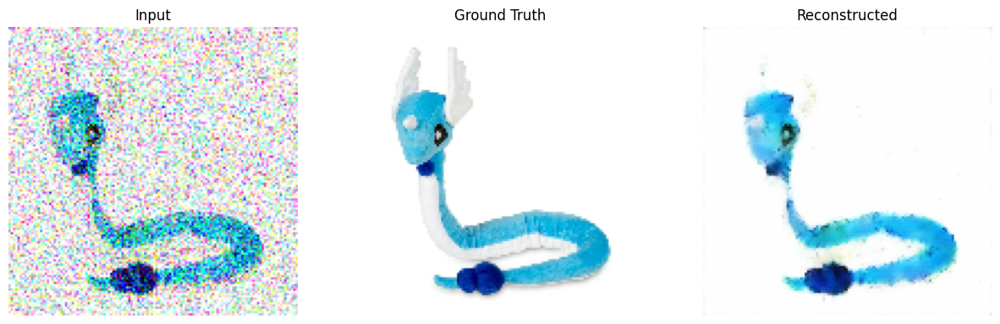

189/189 [==============================] - 13s 70ms/step - loss: 0.0061 - val_loss: 0.0067
Epoch 5/100
189/189 [==============================] - ETA: 0s - loss: 0.0056

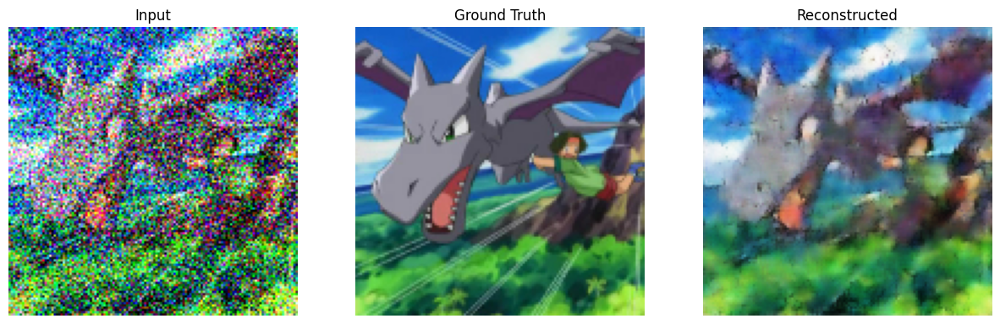

189/189 [==============================] - 13s 70ms/step - loss: 0.0056 - val_loss: 0.0058
Epoch 6/100
189/189 [==============================] - ETA: 0s - loss: 0.0053

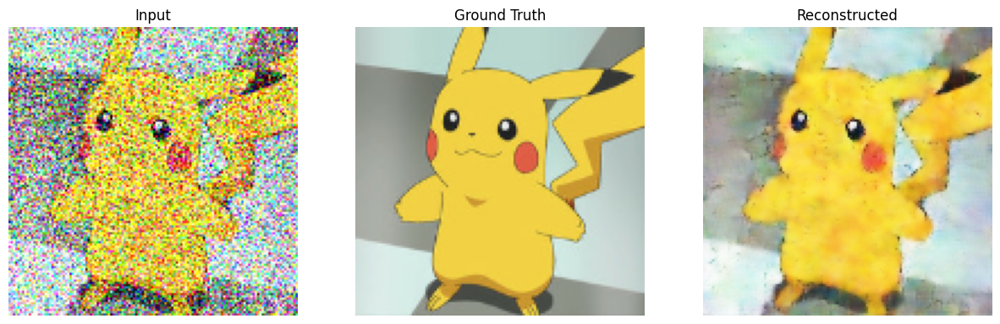

189/189 [==============================] - 13s 70ms/step - loss: 0.0053 - val_loss: 0.0054
Epoch 7/100
189/189 [==============================] - ETA: 0s - loss: 0.0053

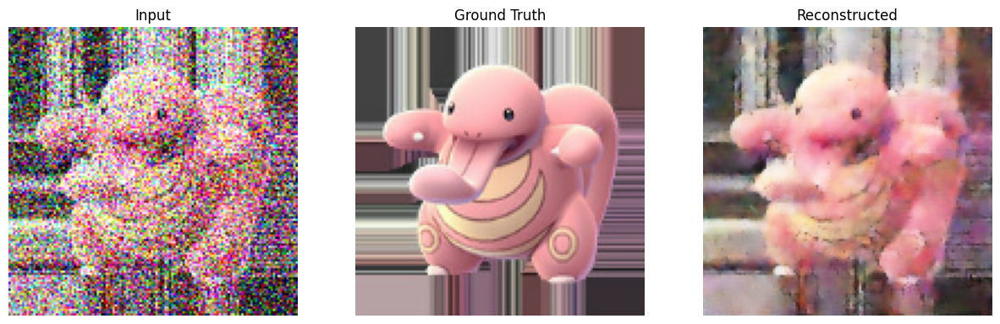

189/189 [==============================] - 13s 70ms/step - loss: 0.0053 - val_loss: 0.0055
Epoch 8/100
189/189 [==============================] - ETA: 0s - loss: 0.0050

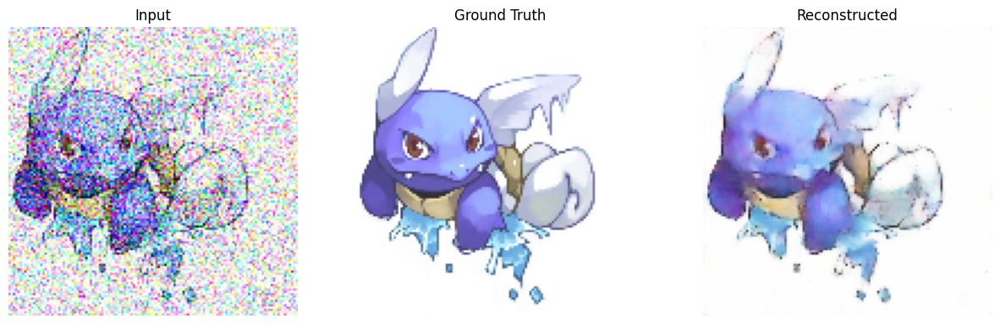

189/189 [==============================] - 13s 70ms/step - loss: 0.0050 - val_loss: 0.0049
Epoch 9/100
189/189 [==============================] - ETA: 0s - loss: 0.0048

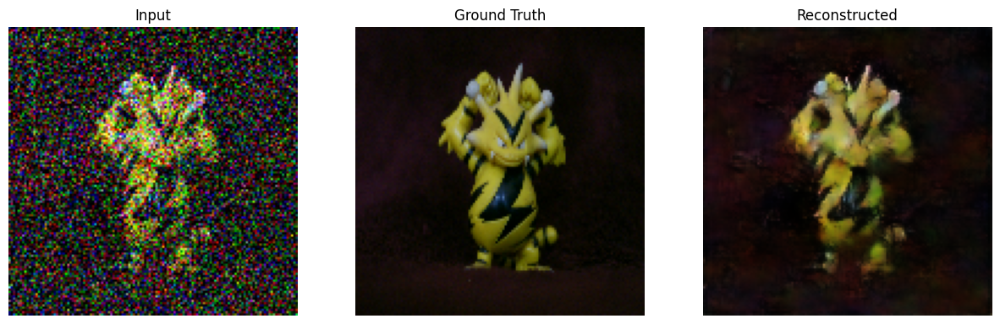

189/189 [==============================] - 13s 70ms/step - loss: 0.0048 - val_loss: 0.0048
Epoch 10/100
189/189 [==============================] - ETA: 0s - loss: 0.0047

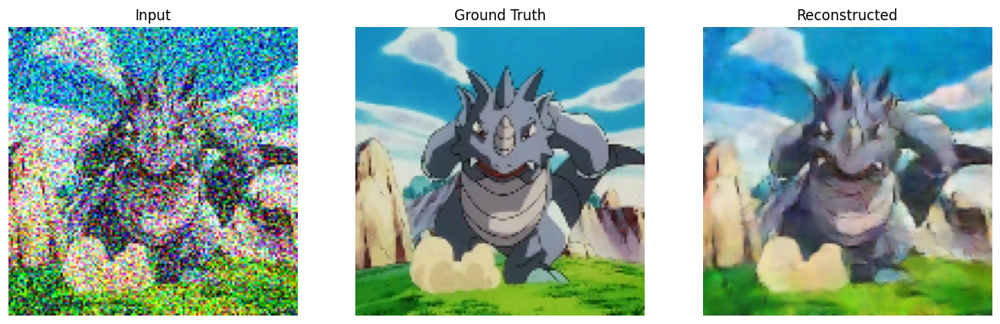

189/189 [==============================] - 13s 71ms/step - loss: 0.0047 - val_loss: 0.0047
Epoch 11/100
189/189 [==============================] - ETA: 0s - loss: 0.0047

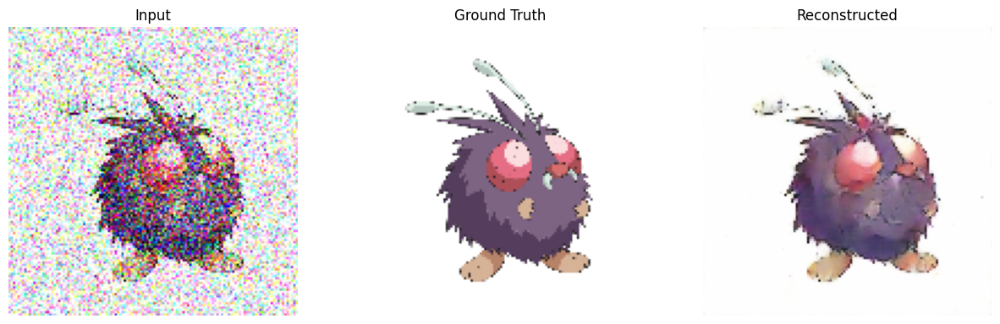

189/189 [==============================] - 13s 70ms/step - loss: 0.0047 - val_loss: 0.0046
Epoch 12/100
189/189 [==============================] - ETA: 0s - loss: 0.0046

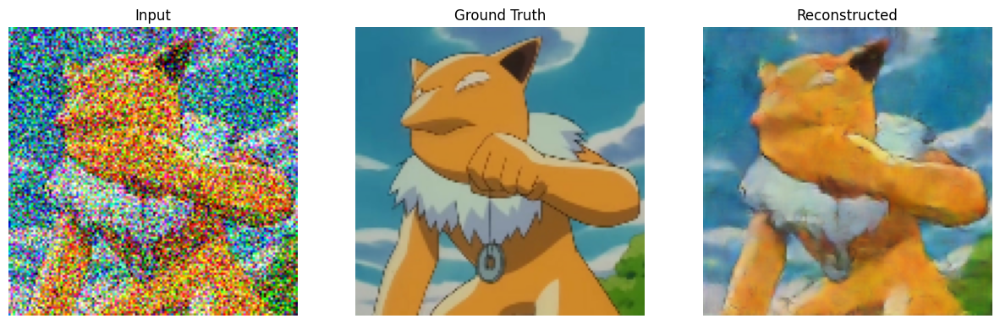

189/189 [==============================] - 13s 70ms/step - loss: 0.0046 - val_loss: 0.0046
Epoch 13/100
189/189 [==============================] - ETA: 0s - loss: 0.0045

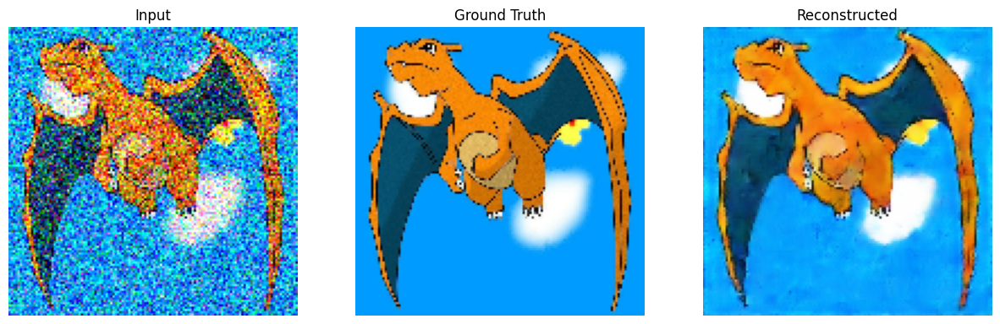

189/189 [==============================] - 13s 70ms/step - loss: 0.0045 - val_loss: 0.0046
Epoch 14/100
189/189 [==============================] - ETA: 0s - loss: 0.0045

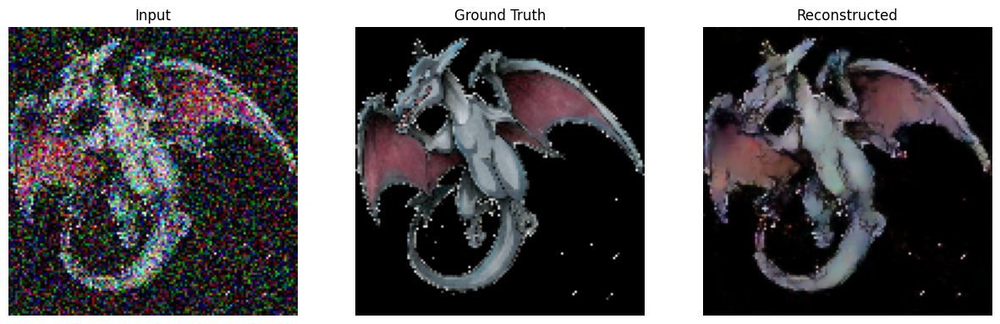

189/189 [==============================] - 13s 70ms/step - loss: 0.0045 - val_loss: 0.0044
Epoch 15/100
189/189 [==============================] - ETA: 0s - loss: 0.0044

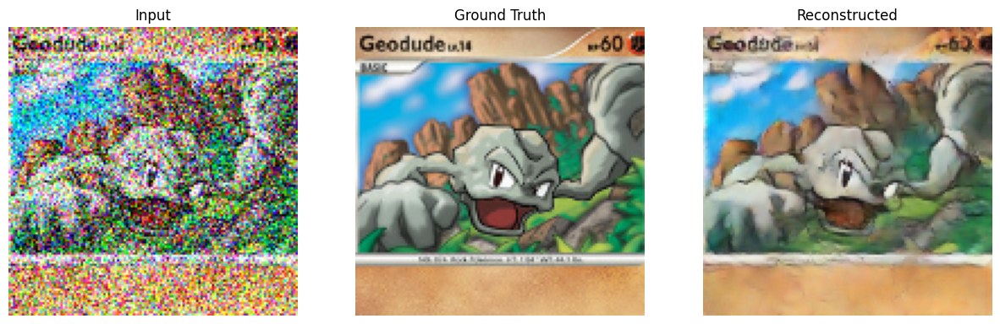

189/189 [==============================] - 13s 71ms/step - loss: 0.0044 - val_loss: 0.0043
Epoch 16/100
189/189 [==============================] - ETA: 0s - loss: 0.0044

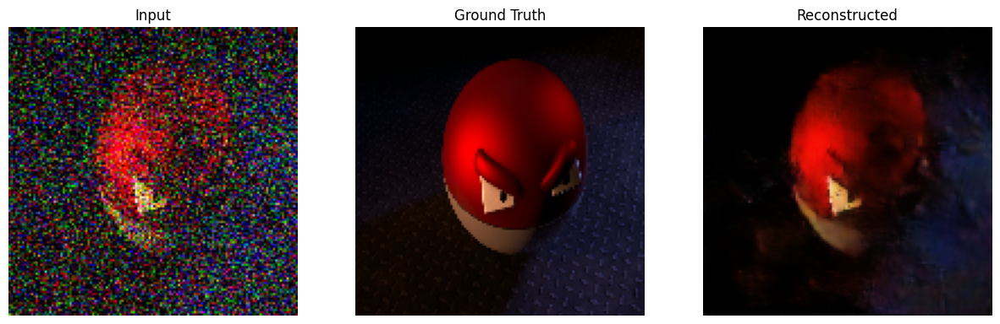

189/189 [==============================] - 13s 70ms/step - loss: 0.0044 - val_loss: 0.0047
Epoch 17/100
189/189 [==============================] - ETA: 0s - loss: 0.0043

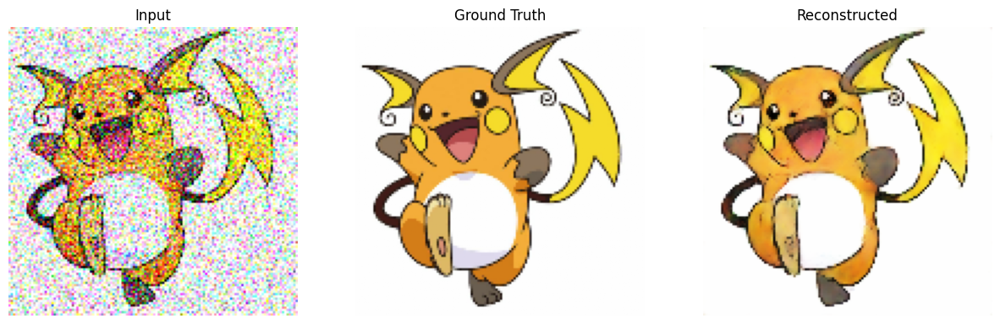

189/189 [==============================] - 13s 70ms/step - loss: 0.0043 - val_loss: 0.0045
Epoch 18/100
189/189 [==============================] - ETA: 0s - loss: 0.0043

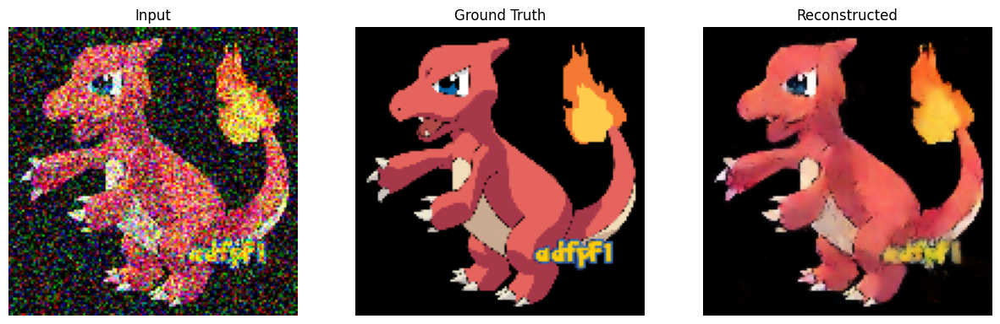

189/189 [==============================] - 13s 70ms/step - loss: 0.0043 - val_loss: 0.0044


In [14]:
model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=[
    tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True),
    di_callback,
])

In [21]:
noisy_test_images, ground_truth_images = next(iter(test_ds.shuffle(256)))

In [22]:
predicted_images = model.predict(noisy_test_images, verbose=0)

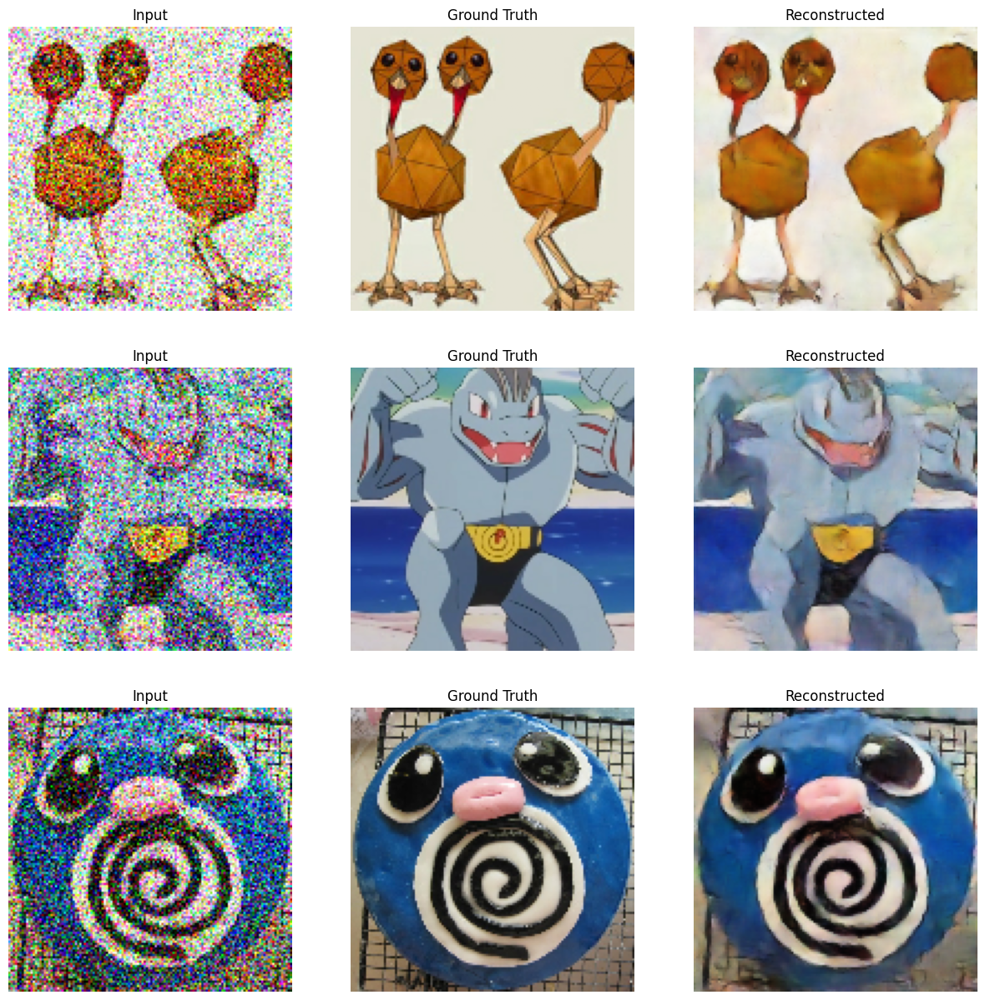

In [26]:
_, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))

for idx in range(3):
    axes[idx, 0].imshow(noisy_test_images[idx])
    axes[idx, 0].set_title("Input")
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(ground_truth_images[idx])
    axes[idx, 1].set_title("Ground Truth")
    axes[idx, 1].axis("off")

    axes[idx, 2].imshow(predicted_images[idx])
    axes[idx, 2].set_title("Reconstructed")
    axes[idx, 2].axis("off")

plt.show()